In [1]:
import sys
sys.path.append("models/")
from setup import out_dir, data_dir, image_dir, model_dir, streetview_dir
%load_ext autoreload
%autoreload 2

import os
from datetime import datetime
import json
from collections import OrderedDict
import logging
import argparse
import numpy as np
import random
import matplotlib.pyplot as plt
import glob
import pandas as pd

import torch
import torch.nn as nn
import torch.optim
import torch.utils.data
import torch.backends.cudnn
import torchvision.utils
import torchvision.transforms
import torch.nn.functional as F

try:
    from tensorboardX import SummaryWriter
    is_tensorboard_available = True
except Exception:
    is_tensorboard_available = False

from dataloader import image_loader, load_demo
from M1_util_train_test import load_model

torch.backends.cudnn.benchmark = True

logging.basicConfig(
    format='[%(asctime)s %(name)s %(levelname)s] - %(message)s',
    datefmt='%Y/%m/%d %H:%M:%S',
    level=logging.DEBUG)
logger = logging.getLogger(__name__)


In [2]:
device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")

In [3]:
from setup import model_dir, image_dir, out_dir, data_dir
from util_model import parse_args

zoomlevel = 'zoom15'
latent_dim = str(100)
image_size = str(64)
im_norm = '2'
model_run_date = "2210gan-0"
model_type = 'dcgan'
loss_func = 'mse'
model_class = 'gan'
base_lr = '0.0002'
weight_decay = '0'

args = parse_args(s=['--zoomlevel', zoomlevel, '--latent_dim', latent_dim, '--image_size', image_size, \
                   '--im_norm', im_norm, '--model_run_date', model_run_date, '--model_type', model_type, \
                    '--loss_func', loss_func, '--model_class', model_class, 
                    '--base_lr', base_lr, '--weight_decay', weight_decay])

from util_model import dcgan_config, load_model

config = dcgan_config(args)

run_config = config['run_config']
optim_config = config['optim_config']
data_config = config['data_config']
model_config = config['model_config']

netD = load_model('dcgan', 'Discriminator', config)
netG = load_model('dcgan', 'Generator', config)

netD = netD.to(device)
netG = netG.to(device)

In [ ]:
# MNIST
import torchvision.transforms as transforms

def setup_data_loaders(batch_size=optim_config['batch_size'], use_cuda=True):
    root = './data'
    download = False
    trans = transforms.ToTensor()
    train_set = MNIST(root=root, train=True, transform=trans,
                      download=download)
    test_set = MNIST(root=root, train=False, transform=trans)

    kwargs = {'num_workers': 1, 'pin_memory': use_cuda}
    train_loader = torch.utils.data.DataLoader(dataset=train_set,
        batch_size=batch_size, shuffle=True, **kwargs)
    test_loader = torch.utils.data.DataLoader(dataset=test_set,
        batch_size=batch_size, shuffle=False, **kwargs)
    return train_loader, test_loader

from pyro.contrib.examples.util import MNIST
train_loader, test_loader = setup_data_loaders()

In [4]:
# CelebA
from torchvision import datasets
import torchvision.transforms as transforms
from torchvision.datasets import CelebA

# train_set = datasets.CelebA(root="./", split="Train", download=True, transform=transforms.ToTensor())
# test_set = datasets.CelebA(root="./", split="Test", download=True, transform=transforms.ToTensor())

transforms = transforms.Compose([transforms.CenterCrop(148),
                                  transforms.Resize(data_config['image_size']),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
        
train_dataset = CelebA(
    "./",
    split='train',
    transform=transforms,
    download=False,
)

test_dataset = CelebA(
    "./",
    split='test',
    transform=transforms,
    download=False,
)

celeb_train_loader = torch.utils.data.DataLoader(
            train_dataset,
            batch_size=optim_config['batch_size'],
            num_workers=8,
            shuffle=True,
            pin_memory=True,
        )

celeb_test_loader = torch.utils.data.DataLoader(
            test_dataset,
            batch_size=optim_config['batch_size'],
            num_workers=8,
            shuffle=True,
            pin_memory=True,
        )

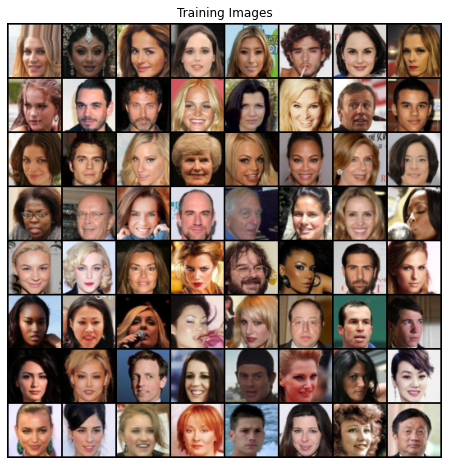

In [14]:
import torchvision.utils as vutils
temp = next(iter(celeb_train_loader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(temp[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)));

In [4]:
# Satellite
train_loader, test_loader = image_loader(image_dir+args.zoomlevel+"/", data_dir, optim_config['batch_size'], 
         run_config['num_workers'], 
         data_config['image_size'], 
         data_version=args.data_version, 
         sampling=args.sampling, 
         recalculate_normalize=False,
         augment=False,
         norm=args.im_norm)

28278 images in dataset
3142 images in dataset


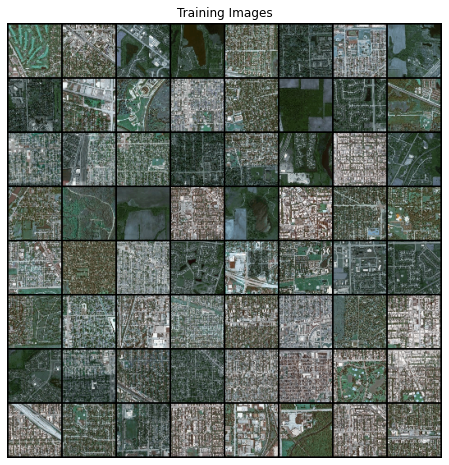

In [8]:
import torchvision.utils as vutils
temp = next(iter(train_loader))[1]
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(temp, padding=2, normalize=True).cpu(),(1,2,0)));

In [6]:
# Streetview
model_run_date = '2209strt'
sampling = 'stratified'
data_version = '1571'

train_loader, test_loader = image_loader(streetview_dir, data_dir, 
                                         optim_config['batch_size'], 
                                         run_config['num_workers'], 
                                         data_config['image_size'], 
                                         data_version=data_version, 
                                         sampling=sampling, 
                                         recalculate_normalize=False,
                                         image_type='jpg',
                                         augment=False,
                                         norm=args.im_norm)

13311 images in dataset
1992 images in dataset


In [9]:
beta1 = 0.5
optimizerG = torch.optim.Adam(netG.parameters(), lr=optim_config['base_lr'], betas=(beta1, 0.999))
optimizerD = torch.optim.Adam(netD.parameters(), lr=optim_config['base_lr'], betas=(beta1, 0.999))


In [10]:
criterion = torch.nn.BCELoss()
num_batches = len(train_loader)
fixed_noise = torch.randn(64, config['model_config']['latent_dim'], 1, 1, device=device)

[1]	Loss_D: 2.1343	Loss_G: 9.2920	D(x): 0.7658	D(G(z)): 0.5781 / 0.0008
[1]	Loss_D: 0.9226	Loss_G: 9.2808	D(x): 0.9066	D(G(z)): 0.4949 / 0.0005
[1]	Loss_D: 0.1248	Loss_G: 4.5403	D(x): 0.9493	D(G(z)): 0.0617 / 0.0304
[1]	Loss_D: 0.7819	Loss_G: 10.2510	D(x): 0.9420	D(G(z)): 0.4577 / 0.0001
[1]	Loss_D: 1.4377	Loss_G: 12.4052	D(x): 0.9876	D(G(z)): 0.6950 / 0.0000
[1]	Loss_D: 0.6385	Loss_G: 1.9504	D(x): 0.7037	D(G(z)): 0.1464 / 0.1867
[1]	Loss_D: 0.3892	Loss_G: 7.3618	D(x): 0.9480	D(G(z)): 0.2551 / 0.0015
[1]	Loss_D: 0.2653	Loss_G: 5.7610	D(x): 0.9201	D(G(z)): 0.1523 / 0.0042
[2]	Loss_D: 0.6490	Loss_G: 9.6823	D(x): 0.9085	D(G(z)): 0.3799 / 0.0001
[2]	Loss_D: 0.9080	Loss_G: 8.8814	D(x): 0.9934	D(G(z)): 0.5067 / 0.0009
[2]	Loss_D: 0.2121	Loss_G: 4.0033	D(x): 0.8671	D(G(z)): 0.0395 / 0.0364
[2]	Loss_D: 0.5247	Loss_G: 6.1583	D(x): 0.6728	D(G(z)): 0.0011 / 0.0031
[2]	Loss_D: 2.5670	Loss_G: 5.7880	D(x): 0.1369	D(G(z)): 0.0010 / 0.0093
[2]	Loss_D: 0.0551	Loss_G: 5.2926	D(x): 0.9937	D(G(z)): 0.0471

[14]	Loss_D: 0.2605	Loss_G: 5.4667	D(x): 0.9874	D(G(z)): 0.1790 / 0.0110
[14]	Loss_D: 0.4376	Loss_G: 4.3217	D(x): 0.7976	D(G(z)): 0.0692 / 0.0358
[14]	Loss_D: 2.1879	Loss_G: 6.1509	D(x): 0.1949	D(G(z)): 0.0003 / 0.0119
[14]	Loss_D: 0.0366	Loss_G: 8.3164	D(x): 0.9933	D(G(z)): 0.0271 / 0.0009
[14]	Loss_D: 2.3562	Loss_G: 2.1914	D(x): 0.2257	D(G(z)): 0.0025 / 0.2420
[14]	Loss_D: 0.8570	Loss_G: 2.9329	D(x): 0.5674	D(G(z)): 0.1138 / 0.0771
[14]	Loss_D: 0.3254	Loss_G: 5.1031	D(x): 0.9874	D(G(z)): 0.2384 / 0.0094
[14]	Loss_D: 0.3798	Loss_G: 6.3941	D(x): 0.9176	D(G(z)): 0.2373 / 0.0024
[14]	Loss_D: 0.2212	Loss_G: 5.3272	D(x): 0.8764	D(G(z)): 0.0600 / 0.0086
[15]	Loss_D: 0.2215	Loss_G: 4.9818	D(x): 0.8899	D(G(z)): 0.0827 / 0.0122
[15]	Loss_D: 0.5716	Loss_G: 8.8033	D(x): 0.9673	D(G(z)): 0.3571 / 0.0002
[15]	Loss_D: 0.4418	Loss_G: 4.2606	D(x): 0.7786	D(G(z)): 0.0304 / 0.0408
[15]	Loss_D: 0.3821	Loss_G: 3.9021	D(x): 0.8679	D(G(z)): 0.1736 / 0.0351
[15]	Loss_D: 1.9649	Loss_G: 9.2370	D(x): 0.9998	D(G

[26]	Loss_D: 0.6976	Loss_G: 8.4598	D(x): 0.9994	D(G(z)): 0.4025 / 0.0006
[26]	Loss_D: 0.0910	Loss_G: 6.0429	D(x): 0.9564	D(G(z)): 0.0401 / 0.0046
[27]	Loss_D: 0.1422	Loss_G: 5.5270	D(x): 0.9179	D(G(z)): 0.0325 / 0.0099
[27]	Loss_D: 0.0777	Loss_G: 5.1081	D(x): 0.9550	D(G(z)): 0.0250 / 0.0139
[27]	Loss_D: 0.0809	Loss_G: 7.0987	D(x): 0.9843	D(G(z)): 0.0552 / 0.0020
[27]	Loss_D: 0.1449	Loss_G: 6.6350	D(x): 0.9747	D(G(z)): 0.1002 / 0.0030
[27]	Loss_D: 0.2241	Loss_G: 7.1576	D(x): 0.9671	D(G(z)): 0.1435 / 0.0029
[27]	Loss_D: 0.0467	Loss_G: 6.2418	D(x): 0.9674	D(G(z)): 0.0118 / 0.0056
[27]	Loss_D: 0.1913	Loss_G: 5.8207	D(x): 0.9388	D(G(z)): 0.1015 / 0.0070
[27]	Loss_D: 0.3610	Loss_G: 7.1945	D(x): 0.9707	D(G(z)): 0.2571 / 0.0012
[27]	Loss_D: 0.1088	Loss_G: 7.2262	D(x): 0.9974	D(G(z)): 0.0882 / 0.0016
[28]	Loss_D: 0.1740	Loss_G: 6.4332	D(x): 0.8668	D(G(z)): 0.0085 / 0.0044
[28]	Loss_D: 0.2448	Loss_G: 6.4558	D(x): 0.9969	D(G(z)): 0.1700 / 0.0039
[28]	Loss_D: 0.9399	Loss_G: 9.7821	D(x): 0.5315	D(G

[39]	Loss_D: 0.0645	Loss_G: 6.6963	D(x): 0.9615	D(G(z)): 0.0165 / 0.0054
[39]	Loss_D: 0.0773	Loss_G: 6.5027	D(x): 0.9497	D(G(z)): 0.0143 / 0.0070
[39]	Loss_D: 0.3951	Loss_G: 6.8887	D(x): 0.9842	D(G(z)): 0.2480 / 0.0020
[39]	Loss_D: 0.2981	Loss_G: 10.0064	D(x): 0.8145	D(G(z)): 0.0001 / 0.0006
[40]	Loss_D: 0.0771	Loss_G: 7.7108	D(x): 0.9783	D(G(z)): 0.0451 / 0.0014
[40]	Loss_D: 0.0308	Loss_G: 6.5369	D(x): 0.9794	D(G(z)): 0.0074 / 0.0133
[40]	Loss_D: 0.1153	Loss_G: 6.0839	D(x): 0.9531	D(G(z)): 0.0561 / 0.0054
[40]	Loss_D: 0.1056	Loss_G: 7.5674	D(x): 0.9325	D(G(z)): 0.0033 / 0.0035
[40]	Loss_D: 0.0049	Loss_G: 9.4428	D(x): 0.9963	D(G(z)): 0.0012 / 0.0007
[40]	Loss_D: 0.8514	Loss_G: 11.1629	D(x): 0.9908	D(G(z)): 0.4079 / 0.0000
[40]	Loss_D: 0.5392	Loss_G: 7.3450	D(x): 0.9064	D(G(z)): 0.2783 / 0.0016
[40]	Loss_D: 0.1766	Loss_G: 5.2706	D(x): 0.9852	D(G(z)): 0.1301 / 0.0098
[40]	Loss_D: 0.3076	Loss_G: 6.6854	D(x): 0.9980	D(G(z)): 0.2172 / 0.0026
[41]	Loss_D: 0.1848	Loss_G: 6.5739	D(x): 0.9991	D

[52]	Loss_D: 0.7011	Loss_G: 11.3715	D(x): 0.6077	D(G(z)): 0.0000 / 0.0003
[52]	Loss_D: 0.0899	Loss_G: 8.1707	D(x): 0.9957	D(G(z)): 0.0649 / 0.0007
[52]	Loss_D: 0.1935	Loss_G: 7.7784	D(x): 0.9963	D(G(z)): 0.1097 / 0.0017
[52]	Loss_D: 0.2833	Loss_G: 4.9493	D(x): 0.9010	D(G(z)): 0.0850 / 0.0260
[52]	Loss_D: 0.0640	Loss_G: 7.1331	D(x): 0.9649	D(G(z)): 0.0242 / 0.0044
[52]	Loss_D: 0.1321	Loss_G: 5.9317	D(x): 0.9756	D(G(z)): 0.0621 / 0.0054
[53]	Loss_D: 0.1116	Loss_G: 6.6176	D(x): 0.9624	D(G(z)): 0.0544 / 0.0050
[53]	Loss_D: 0.0943	Loss_G: 7.6521	D(x): 0.9981	D(G(z)): 0.0635 / 0.0018
[53]	Loss_D: 0.0636	Loss_G: 5.9708	D(x): 0.9971	D(G(z)): 0.0433 / 0.0100
[53]	Loss_D: 0.1106	Loss_G: 4.9171	D(x): 0.9718	D(G(z)): 0.0456 / 0.0184
[53]	Loss_D: 0.0574	Loss_G: 4.6508	D(x): 0.9819	D(G(z)): 0.0340 / 0.0237
[53]	Loss_D: 0.0060	Loss_G: 9.2215	D(x): 0.9952	D(G(z)): 0.0012 / 0.0006
[53]	Loss_D: 0.0635	Loss_G: 9.9711	D(x): 0.9548	D(G(z)): 0.0056 / 0.0004
[53]	Loss_D: 0.2368	Loss_G: 5.7073	D(x): 0.9831	D(

[65]	Loss_D: 0.0572	Loss_G: 6.5657	D(x): 0.9859	D(G(z)): 0.0334 / 0.0055
[65]	Loss_D: 0.0841	Loss_G: 6.6472	D(x): 0.9977	D(G(z)): 0.0564 / 0.0035
[65]	Loss_D: 0.0122	Loss_G: 6.0114	D(x): 0.9994	D(G(z)): 0.0114 / 0.0078
[65]	Loss_D: 0.0901	Loss_G: 6.2493	D(x): 0.9488	D(G(z)): 0.0288 / 0.0096
[65]	Loss_D: 0.7167	Loss_G: 14.9174	D(x): 0.9951	D(G(z)): 0.3323 / 0.0000
[65]	Loss_D: 0.1274	Loss_G: 7.1960	D(x): 0.9959	D(G(z)): 0.0996 / 0.0023
[65]	Loss_D: 0.0549	Loss_G: 8.6261	D(x): 0.9619	D(G(z)): 0.0017 / 0.0012
[65]	Loss_D: 0.3327	Loss_G: 7.0605	D(x): 0.9239	D(G(z)): 0.1713 / 0.0027
[66]	Loss_D: 0.0620	Loss_G: 5.2485	D(x): 0.9759	D(G(z)): 0.0281 / 0.0212
[66]	Loss_D: 0.0202	Loss_G: 9.5811	D(x): 0.9997	D(G(z)): 0.0142 / 0.0010
[66]	Loss_D: 0.7220	Loss_G: 2.6281	D(x): 0.6248	D(G(z)): 0.0109 / 0.1894
[66]	Loss_D: 0.0310	Loss_G: 6.2438	D(x): 0.9983	D(G(z)): 0.0236 / 0.0061
[66]	Loss_D: 0.0543	Loss_G: 6.6951	D(x): 0.9978	D(G(z)): 0.0477 / 0.0039
[66]	Loss_D: 0.0442	Loss_G: 7.9833	D(x): 0.9804	D(

[77]	Loss_D: 0.0588	Loss_G: 6.2071	D(x): 0.9945	D(G(z)): 0.0400 / 0.0069
[77]	Loss_D: 0.0344	Loss_G: 6.7869	D(x): 0.9934	D(G(z)): 0.0245 / 0.0080
[78]	Loss_D: 0.0035	Loss_G: 10.6328	D(x): 0.9998	D(G(z)): 0.0033 / 0.0003
[78]	Loss_D: 0.0651	Loss_G: 6.3231	D(x): 0.9803	D(G(z)): 0.0309 / 0.0102
[78]	Loss_D: 0.1443	Loss_G: 6.8488	D(x): 0.9995	D(G(z)): 0.0897 / 0.0045
[78]	Loss_D: 0.3220	Loss_G: 4.2802	D(x): 0.9985	D(G(z)): 0.1888 / 0.0578
[78]	Loss_D: 0.2534	Loss_G: 7.2330	D(x): 0.9526	D(G(z)): 0.1464 / 0.0019
[78]	Loss_D: 0.1172	Loss_G: 6.4589	D(x): 0.9632	D(G(z)): 0.0475 / 0.0064
[78]	Loss_D: 0.0356	Loss_G: 8.7789	D(x): 0.9829	D(G(z)): 0.0163 / 0.0025
[78]	Loss_D: 0.0369	Loss_G: 5.9221	D(x): 0.9992	D(G(z)): 0.0333 / 0.0100
[78]	Loss_D: 0.0544	Loss_G: 6.3162	D(x): 0.9592	D(G(z)): 0.0090 / 0.0054
[79]	Loss_D: 0.0181	Loss_G: 7.9417	D(x): 0.9896	D(G(z)): 0.0067 / 0.0038
[79]	Loss_D: 0.1091	Loss_G: 6.8136	D(x): 0.9222	D(G(z)): 0.0037 / 0.0145
[79]	Loss_D: 0.0487	Loss_G: 4.5023	D(x): 0.9831	D(

[90]	Loss_D: 0.0086	Loss_G: 7.9308	D(x): 0.9945	D(G(z)): 0.0030 / 0.0023
[90]	Loss_D: 0.0199	Loss_G: 9.0062	D(x): 0.9837	D(G(z)): 0.0025 / 0.0009
[90]	Loss_D: 0.5201	Loss_G: 5.7262	D(x): 0.7062	D(G(z)): 0.0003 / 0.0286
[90]	Loss_D: 0.2344	Loss_G: 3.2517	D(x): 0.8684	D(G(z)): 0.0345 / 0.0833
[91]	Loss_D: 2.9805	Loss_G: 1.3963	D(x): 0.2310	D(G(z)): 0.0014 / 0.8834
[91]	Loss_D: 0.0526	Loss_G: 5.7828	D(x): 0.9788	D(G(z)): 0.0276 / 0.0189
[91]	Loss_D: 0.1492	Loss_G: 8.4005	D(x): 0.9827	D(G(z)): 0.0982 / 0.0007
[91]	Loss_D: 0.1426	Loss_G: 6.6305	D(x): 0.9765	D(G(z)): 0.0751 / 0.0070
[91]	Loss_D: 0.0111	Loss_G: 6.6150	D(x): 0.9999	D(G(z)): 0.0106 / 0.0052
[91]	Loss_D: 0.0464	Loss_G: 7.5947	D(x): 0.9767	D(G(z)): 0.0182 / 0.0028
[91]	Loss_D: 0.2429	Loss_G: 11.5587	D(x): 0.8648	D(G(z)): 0.0002 / 0.0001
[91]	Loss_D: 0.0945	Loss_G: 5.5830	D(x): 0.9828	D(G(z)): 0.0582 / 0.0115
[91]	Loss_D: 0.2795	Loss_G: 9.4954	D(x): 0.9995	D(G(z)): 0.1741 / 0.0003
[92]	Loss_D: 0.0646	Loss_G: 6.8263	D(x): 0.9479	D(

[103]	Loss_D: 0.0059	Loss_G: 11.3665	D(x): 0.9977	D(G(z)): 0.0035 / 0.0006
[103]	Loss_D: 0.0472	Loss_G: 6.7606	D(x): 0.9983	D(G(z)): 0.0339 / 0.0081
[103]	Loss_D: 0.0455	Loss_G: 7.1596	D(x): 0.9949	D(G(z)): 0.0352 / 0.0049
[103]	Loss_D: 0.8510	Loss_G: 14.8378	D(x): 0.9998	D(G(z)): 0.3879 / 0.0000
[103]	Loss_D: 0.1149	Loss_G: 5.9989	D(x): 0.9472	D(G(z)): 0.0123 / 0.0184
[103]	Loss_D: 0.2121	Loss_G: 6.9195	D(x): 0.9621	D(G(z)): 0.1189 / 0.0029
[103]	Loss_D: 0.2671	Loss_G: 5.2577	D(x): 0.8962	D(G(z)): 0.1010 / 0.0154
[104]	Loss_D: 0.0174	Loss_G: 11.9468	D(x): 0.9851	D(G(z)): 0.0007 / 0.0001
[104]	Loss_D: 0.0221	Loss_G: 9.0463	D(x): 0.9974	D(G(z)): 0.0176 / 0.0044
[104]	Loss_D: 0.3209	Loss_G: 3.7833	D(x): 0.8298	D(G(z)): 0.0327 / 0.1114
[104]	Loss_D: 0.0401	Loss_G: 7.0914	D(x): 0.9757	D(G(z)): 0.0102 / 0.0037
[104]	Loss_D: 0.0446	Loss_G: 8.2622	D(x): 0.9911	D(G(z)): 0.0240 / 0.0011
[104]	Loss_D: 0.1745	Loss_G: 8.3333	D(x): 0.9935	D(G(z)): 0.1193 / 0.0015
[104]	Loss_D: 0.1925	Loss_G: 9.2311

[115]	Loss_D: 0.1184	Loss_G: 6.7173	D(x): 0.9828	D(G(z)): 0.0682 / 0.0090
[115]	Loss_D: 0.0528	Loss_G: 9.2018	D(x): 0.9740	D(G(z)): 0.0029 / 0.0027
[116]	Loss_D: 0.4277	Loss_G: 6.7149	D(x): 0.7818	D(G(z)): 0.0003 / 0.0224
[116]	Loss_D: 0.0212	Loss_G: 10.0744	D(x): 0.9819	D(G(z)): 0.0012 / 0.0028
[116]	Loss_D: 0.1019	Loss_G: 7.4005	D(x): 0.9752	D(G(z)): 0.0498 / 0.0031
[116]	Loss_D: 0.0869	Loss_G: 5.2264	D(x): 0.9459	D(G(z)): 0.0201 / 0.0168
[116]	Loss_D: 0.4018	Loss_G: 8.2489	D(x): 0.7645	D(G(z)): 0.0011 / 0.0034
[116]	Loss_D: 0.1015	Loss_G: 12.1413	D(x): 0.9506	D(G(z)): 0.0010 / 0.0005
[116]	Loss_D: 0.0570	Loss_G: 7.0737	D(x): 0.9991	D(G(z)): 0.0403 / 0.0045
[116]	Loss_D: 0.0989	Loss_G: 7.4063	D(x): 0.9338	D(G(z)): 0.0099 / 0.0085
[116]	Loss_D: 0.3279	Loss_G: 11.8498	D(x): 0.9998	D(G(z)): 0.1863 / 0.0000
[117]	Loss_D: 0.0225	Loss_G: 9.9204	D(x): 0.9833	D(G(z)): 0.0041 / 0.0007
[117]	Loss_D: 0.0817	Loss_G: 8.2786	D(x): 0.9798	D(G(z)): 0.0424 / 0.0016
[117]	Loss_D: 0.2310	Loss_G: 11.147

[128]	Loss_D: 0.3139	Loss_G: 7.8562	D(x): 0.9954	D(G(z)): 0.1866 / 0.0008
[128]	Loss_D: 0.2079	Loss_G: 7.9832	D(x): 0.8640	D(G(z)): 0.0017 / 0.0178
[128]	Loss_D: 1.1331	Loss_G: 15.0282	D(x): 0.9992	D(G(z)): 0.4539 / 0.0000
[128]	Loss_D: 0.0679	Loss_G: 5.6246	D(x): 0.9909	D(G(z)): 0.0522 / 0.0123
[128]	Loss_D: 0.0649	Loss_G: 9.1072	D(x): 0.9930	D(G(z)): 0.0465 / 0.0079
[128]	Loss_D: 0.0233	Loss_G: 6.1955	D(x): 0.9883	D(G(z)): 0.0110 / 0.0111
[129]	Loss_D: 0.1252	Loss_G: 9.3283	D(x): 0.9684	D(G(z)): 0.0706 / 0.0084
[129]	Loss_D: 0.4360	Loss_G: 10.7039	D(x): 0.9792	D(G(z)): 0.2483 / 0.0001
[129]	Loss_D: 0.0218	Loss_G: 6.1462	D(x): 0.9984	D(G(z)): 0.0189 / 0.0100
[129]	Loss_D: 0.0979	Loss_G: 6.0505	D(x): 0.9406	D(G(z)): 0.0221 / 0.0107
[129]	Loss_D: 0.2041	Loss_G: 5.6927	D(x): 0.9194	D(G(z)): 0.0535 / 0.0147
[129]	Loss_D: 0.1830	Loss_G: 11.0376	D(x): 0.9994	D(G(z)): 0.0499 / 0.0002
[129]	Loss_D: 0.1100	Loss_G: 6.2399	D(x): 0.9346	D(G(z)): 0.0015 / 0.0225
[129]	Loss_D: 0.1363	Loss_G: 9.8868

[140]	Loss_D: 0.0293	Loss_G: 6.3616	D(x): 0.9982	D(G(z)): 0.0248 / 0.0133
[141]	Loss_D: 0.0335	Loss_G: 6.4257	D(x): 0.9905	D(G(z)): 0.0230 / 0.0097
[141]	Loss_D: 0.0979	Loss_G: 8.0268	D(x): 0.9991	D(G(z)): 0.0778 / 0.0034
[141]	Loss_D: 0.0937	Loss_G: 7.2220	D(x): 0.9806	D(G(z)): 0.0325 / 0.0197
[141]	Loss_D: 0.3902	Loss_G: 6.7649	D(x): 0.9989	D(G(z)): 0.2312 / 0.0029
[141]	Loss_D: 0.0450	Loss_G: 6.0522	D(x): 0.9857	D(G(z)): 0.0269 / 0.0126
[141]	Loss_D: 0.0408	Loss_G: 11.1802	D(x): 0.9641	D(G(z)): 0.0004 / 0.0005
[141]	Loss_D: 0.0879	Loss_G: 7.2617	D(x): 0.9322	D(G(z)): 0.0058 / 0.0128
[141]	Loss_D: 0.1959	Loss_G: 7.6956	D(x): 0.9937	D(G(z)): 0.0744 / 0.0020
[141]	Loss_D: 0.1870	Loss_G: 7.1920	D(x): 0.9777	D(G(z)): 0.0484 / 0.0065
[142]	Loss_D: 0.0462	Loss_G: 10.0242	D(x): 0.9769	D(G(z)): 0.0159 / 0.0047
[142]	Loss_D: 0.1504	Loss_G: 7.7889	D(x): 0.9821	D(G(z)): 0.0944 / 0.0010
[142]	Loss_D: 0.0135	Loss_G: 13.6687	D(x): 0.9989	D(G(z)): 0.0090 / 0.0006
[142]	Loss_D: 0.0028	Loss_G: 10.653

[153]	Loss_D: 0.0379	Loss_G: 6.5039	D(x): 0.9888	D(G(z)): 0.0234 / 0.0071
[153]	Loss_D: 0.0651	Loss_G: 13.3885	D(x): 0.9463	D(G(z)): 0.0003 / 0.0002
[153]	Loss_D: 0.0238	Loss_G: 8.8989	D(x): 0.9867	D(G(z)): 0.0093 / 0.0067
[153]	Loss_D: 0.0256	Loss_G: 7.2795	D(x): 0.9806	D(G(z)): 0.0041 / 0.0055
[153]	Loss_D: 0.0681	Loss_G: 9.0100	D(x): 0.9413	D(G(z)): 0.0015 / 0.0010
[154]	Loss_D: 0.5079	Loss_G: 4.1174	D(x): 0.7343	D(G(z)): 0.0009 / 0.0954
[154]	Loss_D: 0.1767	Loss_G: 5.3150	D(x): 0.8895	D(G(z)): 0.0239 / 0.0353
[154]	Loss_D: 0.4190	Loss_G: 7.0262	D(x): 0.7634	D(G(z)): 0.0002 / 0.0138
[154]	Loss_D: 0.0374	Loss_G: 7.2975	D(x): 0.9801	D(G(z)): 0.0157 / 0.0057
[154]	Loss_D: 0.0990	Loss_G: 12.2134	D(x): 0.9872	D(G(z)): 0.0545 / 0.0027
[154]	Loss_D: 0.0245	Loss_G: 6.7923	D(x): 0.9989	D(G(z)): 0.0197 / 0.0084
[154]	Loss_D: 0.2781	Loss_G: 8.6290	D(x): 0.9951	D(G(z)): 0.1911 / 0.0007
[154]	Loss_D: 0.0708	Loss_G: 7.4907	D(x): 0.9559	D(G(z)): 0.0088 / 0.0054
[154]	Loss_D: 0.0394	Loss_G: 7.2612	

[166]	Loss_D: 0.0566	Loss_G: 6.0941	D(x): 0.9930	D(G(z)): 0.0419 / 0.0081
[166]	Loss_D: 0.0468	Loss_G: 6.1240	D(x): 0.9958	D(G(z)): 0.0382 / 0.0082
[166]	Loss_D: 0.4007	Loss_G: 7.1223	D(x): 0.7678	D(G(z)): 0.0006 / 0.0171
[166]	Loss_D: 0.4689	Loss_G: 12.2250	D(x): 0.9713	D(G(z)): 0.2727 / 0.0001
[166]	Loss_D: 0.0736	Loss_G: 5.5677	D(x): 0.9944	D(G(z)): 0.0582 / 0.0186
[166]	Loss_D: 0.0547	Loss_G: 5.7503	D(x): 0.9800	D(G(z)): 0.0198 / 0.0733
[166]	Loss_D: 0.1974	Loss_G: 10.0948	D(x): 0.9988	D(G(z)): 0.1341 / 0.0010
[166]	Loss_D: 0.7429	Loss_G: 13.2686	D(x): 0.9987	D(G(z)): 0.3813 / 0.0001
[166]	Loss_D: 0.0287	Loss_G: 13.7739	D(x): 0.9732	D(G(z)): 0.0003 / 0.0001
[167]	Loss_D: 0.0696	Loss_G: 10.4410	D(x): 0.9840	D(G(z)): 0.0363 / 0.0013
[167]	Loss_D: 0.0338	Loss_G: 11.4779	D(x): 0.9913	D(G(z)): 0.0187 / 0.0005
[167]	Loss_D: 0.4969	Loss_G: 5.6785	D(x): 0.7443	D(G(z)): 0.0020 / 0.0260
[167]	Loss_D: 0.6617	Loss_G: 5.5347	D(x): 0.6944	D(G(z)): 0.0018 / 0.0690
[167]	Loss_D: 0.0186	Loss_G: 7.7

[178]	Loss_D: 0.0678	Loss_G: 8.0666	D(x): 0.9483	D(G(z)): 0.0018 / 0.0021
[178]	Loss_D: 0.0387	Loss_G: 10.7520	D(x): 0.9908	D(G(z)): 0.0253 / 0.0019
[178]	Loss_D: 0.2008	Loss_G: 8.8242	D(x): 0.9434	D(G(z)): 0.0834 / 0.0039
[178]	Loss_D: 0.0257	Loss_G: 8.8613	D(x): 0.9791	D(G(z)): 0.0029 / 0.0016
[179]	Loss_D: 0.0125	Loss_G: 10.2370	D(x): 0.9946	D(G(z)): 0.0068 / 0.0022
[179]	Loss_D: 0.0986	Loss_G: 8.1624	D(x): 0.9934	D(G(z)): 0.0441 / 0.0035
[179]	Loss_D: 0.0416	Loss_G: 9.5132	D(x): 0.9804	D(G(z)): 0.0131 / 0.0016
[179]	Loss_D: 0.6077	Loss_G: 8.4351	D(x): 0.7358	D(G(z)): 0.0002 / 0.0851
[179]	Loss_D: 0.7167	Loss_G: 1.9723	D(x): 0.7066	D(G(z)): 0.0972 / 0.2788
[179]	Loss_D: 0.1141	Loss_G: 8.3562	D(x): 0.9932	D(G(z)): 0.0662 / 0.0030
[179]	Loss_D: 0.1557	Loss_G: 6.3447	D(x): 0.9010	D(G(z)): 0.0172 / 0.0170
[179]	Loss_D: 0.1078	Loss_G: 7.4209	D(x): 0.9995	D(G(z)): 0.0826 / 0.0014
[179]	Loss_D: 0.0107	Loss_G: 9.1669	D(x): 0.9927	D(G(z)): 0.0030 / 0.0013
[180]	Loss_D: 0.1291	Loss_G: 8.5909	

[191]	Loss_D: 0.2408	Loss_G: 15.3297	D(x): 0.8214	D(G(z)): 0.0001 / 0.0000
[191]	Loss_D: 0.0306	Loss_G: 8.9567	D(x): 0.9756	D(G(z)): 0.0040 / 0.0035
[191]	Loss_D: 0.0349	Loss_G: 8.3801	D(x): 0.9863	D(G(z)): 0.0114 / 0.0044
[191]	Loss_D: 0.0171	Loss_G: 6.6590	D(x): 0.9999	D(G(z)): 0.0157 / 0.0080
[191]	Loss_D: 0.0220	Loss_G: 11.0088	D(x): 0.9974	D(G(z)): 0.0176 / 0.0039
[191]	Loss_D: 0.1959	Loss_G: 7.4533	D(x): 0.8700	D(G(z)): 0.0041 / 0.0111
[191]	Loss_D: 0.0461	Loss_G: 5.8116	D(x): 0.9613	D(G(z)): 0.0052 / 0.0167
[191]	Loss_D: 0.0546	Loss_G: 7.2375	D(x): 0.9896	D(G(z)): 0.0382 / 0.0064
[192]	Loss_D: 0.0604	Loss_G: 7.4914	D(x): 0.9828	D(G(z)): 0.0337 / 0.0032
[192]	Loss_D: 0.0610	Loss_G: 6.5329	D(x): 0.9696	D(G(z)): 0.0235 / 0.0110
[192]	Loss_D: 0.0907	Loss_G: 10.7453	D(x): 0.9994	D(G(z)): 0.0491 / 0.0016
[192]	Loss_D: 0.0158	Loss_G: 10.5060	D(x): 0.9860	D(G(z)): 0.0010 / 0.0010
[192]	Loss_D: 0.0533	Loss_G: 10.2598	D(x): 0.9676	D(G(z)): 0.0117 / 0.0049
[192]	Loss_D: 0.0447	Loss_G: 6.39

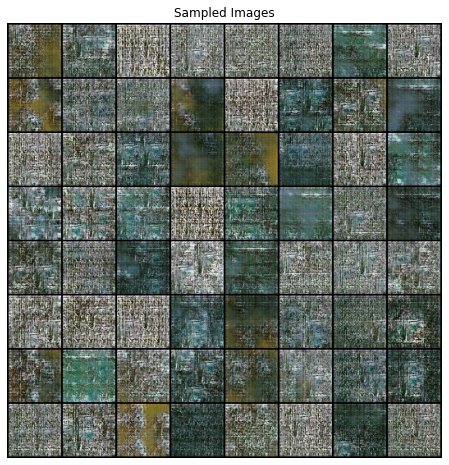

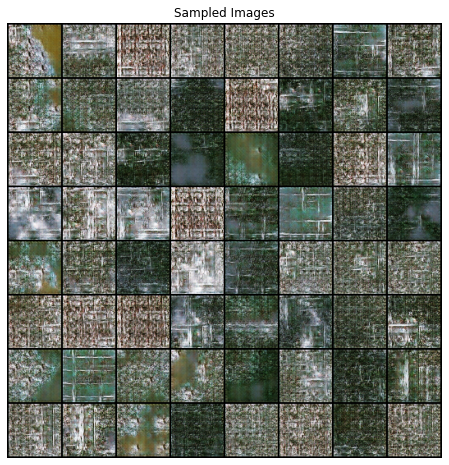

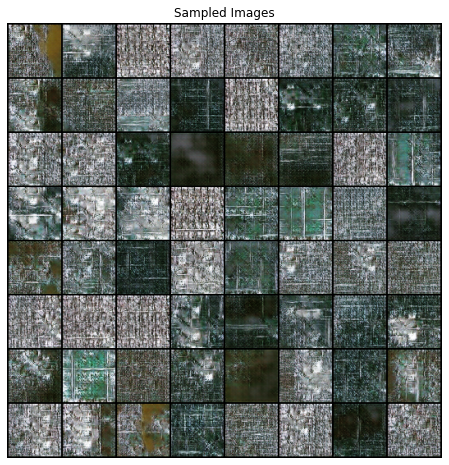

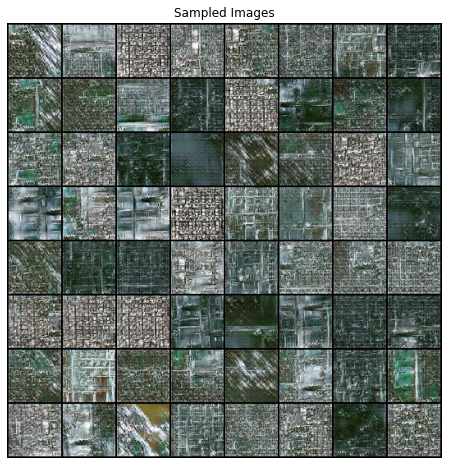

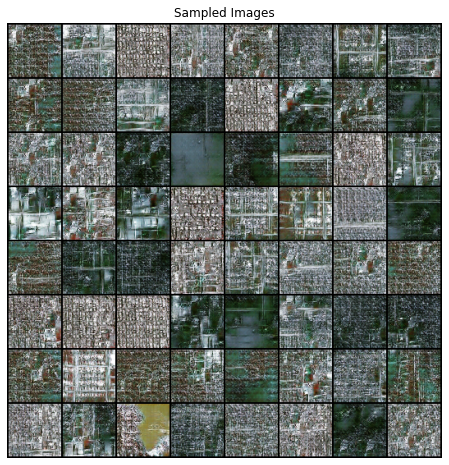

...

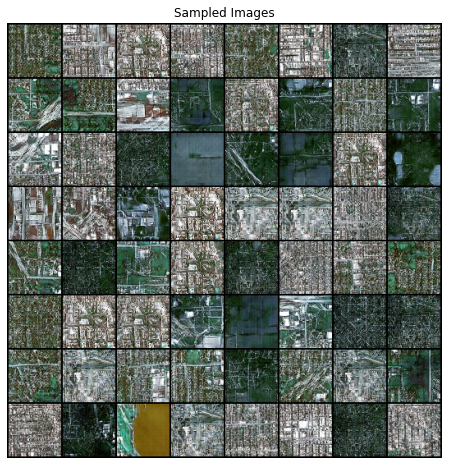

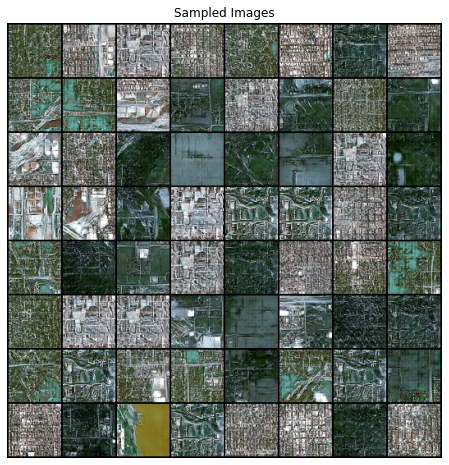

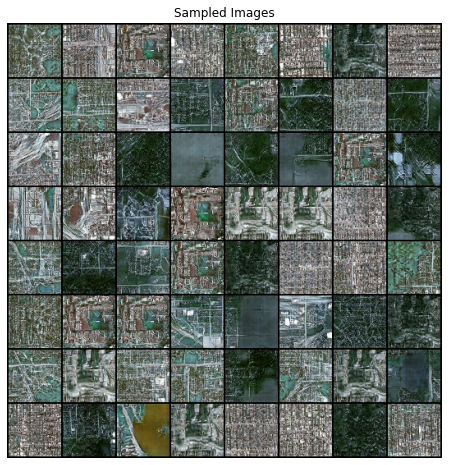

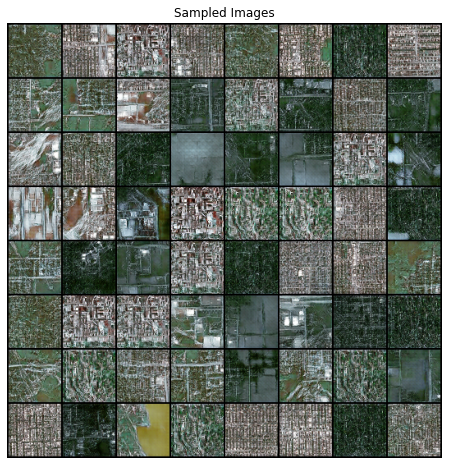

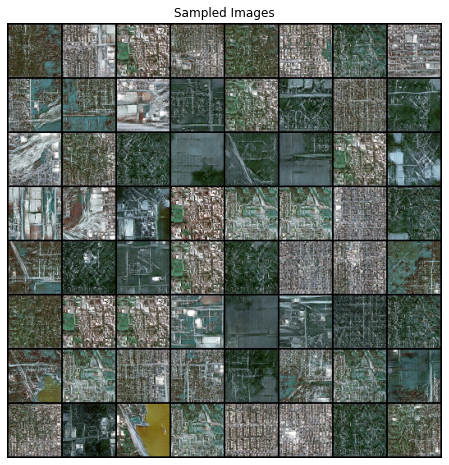

In [15]:
G_losses = []
D_losses = []

real_label = 1
fake_label = 0

start_epoch = 1
iters = 0

for epoch in range(start_epoch, start_epoch+optim_config['epochs']):
    
    loss_d = 0
    loss_g = 0

    for step, (image_list, data) in enumerate(train_loader):
#     for data, _ in celeb_train_loader:
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data.to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()
        
        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, config['model_config']['latent_dim'], 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()
        
#         loss_d += errD.item()
        
        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        
#         loss_g += errG.item()
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        iters += 1
        if iters % 50 == 0:
        # Output training stats
            print('[%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        
    # Check how the generator is doing by saving G's output on fixed_noise
    if epoch % 10 == 0:

        with torch.no_grad():
            fake = netG(fixed_noise).detach().cpu()
        fig, ax = plt.subplots(1,1,figsize=(8,8))
        ax.axis("off")
        ax.set_title("Sampled Images")
        ax.imshow(np.transpose(torchvision.utils.make_grid(fake, padding=2, normalize=True).cpu(),(1,2,0)))
        fig.savefig(out_dir+"GAN_"+str(epoch)+".png", bbox_inches='tight')
        
#     print(epoch, loss_d/num_batches, loss_g/num_batches)
    

        if config['run_config']['save']:
            torch.save({'epoch': epoch,
                'generator_model_state_dict': netG.state_dict(),
                'discriminator_model_state_dict': netD.state_dict(),
                'optimizerG_state_dict': optimizerG,
                'optimizerD_state_dict': optimizerD,
                'config': config},
                model_dir+"GAN_"+zoomlevel+"_"+str(model_config['latent_dim'])+"_"+
                model_run_date+"_"+str(epoch)+".pt")

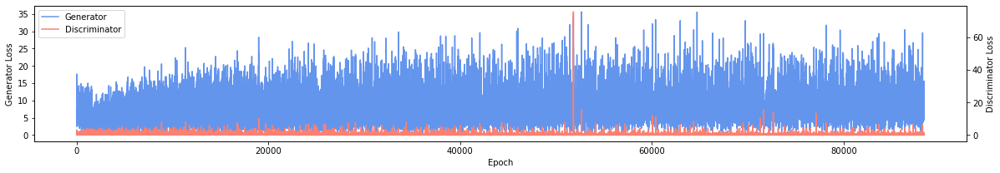

In [19]:
fig, ax = plt.subplots(1, figsize=(20,3))
ln1 = ax.plot(G_losses, label='Generator', color='cornflowerblue')
ax2 = ax.twinx()
ln2 = ax2.plot(D_losses, label='Discriminator', color='salmon')

lns = ln1+ln2
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, loc=0)

ax.set_xlabel("Epoch")
ax.set_ylabel("Generator Loss")
ax2.set_ylabel("Discriminator Loss")

# fig.savefig(out_dir+"training_plots/"+model_type+"_"+zoomlevel+"_"+str(latent_dim)+"_"+
#                 model_save_variable_names[y]+"_"+model_run_date+".png", bbox_inches='tight')
plt.show()


In [30]:
D_encoded = netD.return_latent(netG(fixed_noise)).detach().cpu().numpy().reshape(64,100)

In [34]:
import scipy.spatial.distance as distance

In [43]:
encoded_distance = distance.pdist(D_encoded)

In [42]:
noise_distance = distance.pdist(fixed_noise.detach().cpu().numpy().reshape(64,100))

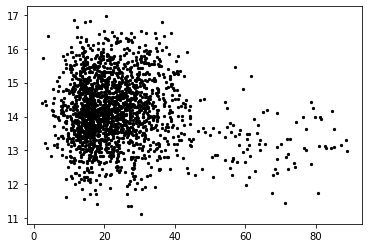

In [47]:
plt.scatter(encoded_distance, noise_distance, s=5, color='k')
plt.